In [2]:
import cv2 as cv
from matplotlib import pyplot as plt
import numpy as np
from scipy.special import factorial

img = cv.imread('./img/lena.jpg', cv.IMREAD_GRAYSCALE)

# Bildrauschen
## Gaußsches Rauschen

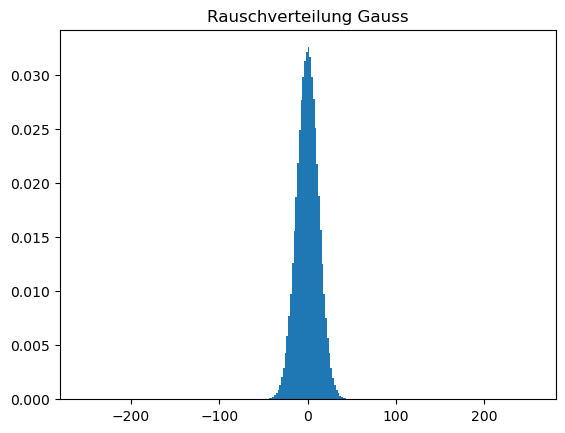

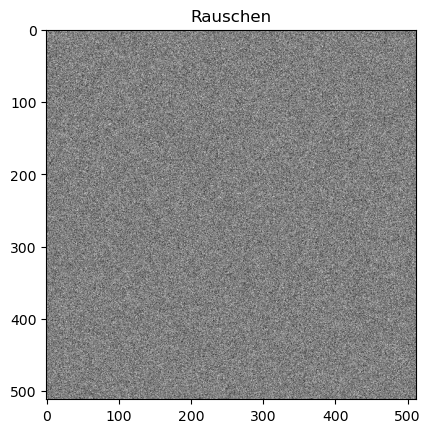

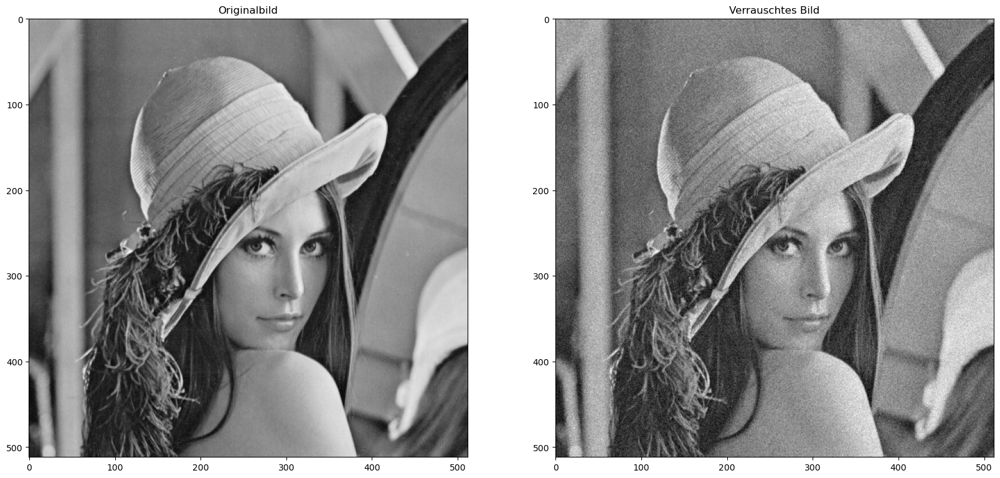

In [3]:
# die Berechnung der Rausch-Überlagerung ist folgender Quelle entnommen:
# https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv

# Gaussches Rauschen
# img:  Bild
# mean: Mittelwert der Gauß-Verteilung
# var:  Varianz der Gauß-Verteilung
# debug:falls True, so werden Rauschverteilung und Rauschbild ausgegeben
def add_gauss(img, mean=0, var=0.1, debug=False):
    row, col = img.shape
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, (row, col))
    gauss = gauss.reshape(row, col)

    noisy = np.clip(img + gauss, 0, 255)

    if (debug):
        plt.figure()
        plt.hist(gauss.ravel(), 256, [-255, 255], density=True)
        plt.title('Rauschverteilung Gauss')
        plt.show()
        plt.title('Rauschen')
        plt.imshow(gauss, cmap='gray', vmin=-50, vmax=50)
        plt.show()

    return noisy


dst = add_gauss(img, mean=0, var=150, debug=True)
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 2, 2)
plt.imshow(dst, cmap='gray')
plt.title('Verrauschtes Bild')
plt.show()

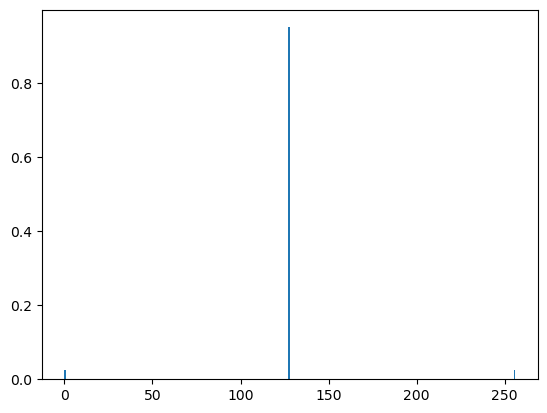

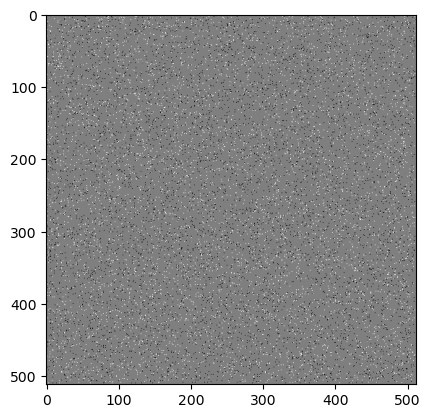

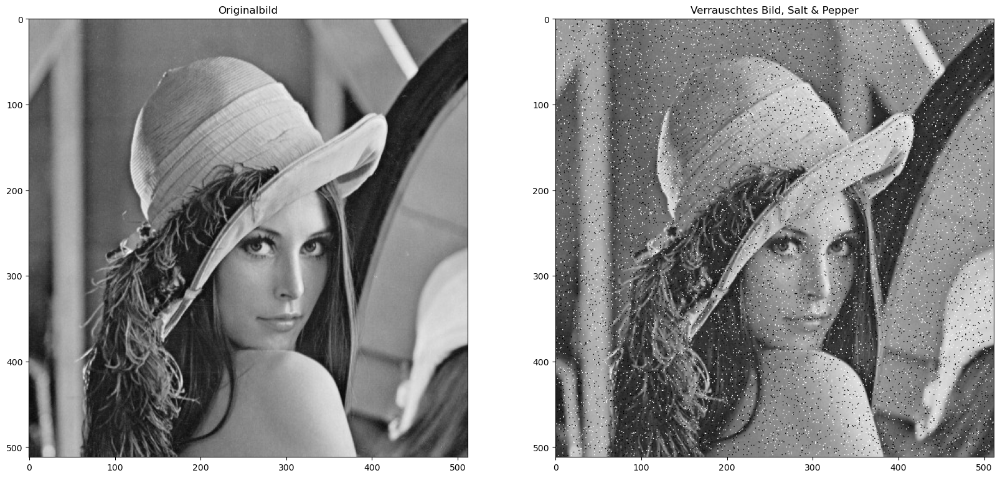

In [4]:
# Salt-and-Pepper-Rauschen
# img:    Bild
# s_vs_p: Verhältnis von Salz  (weiße Störungen) und Pfeffer (schwarze Störungen)
# amount: Anteil der gestörten Pixel am Gesamtbild
# debug:  falls True, so werden Rauschverteilung und Rauschbild ausgegeben
def add_salt_pepper(img, s_vs_p=0.5, amount=0.05, debug=False):
    row, col = img.shape
    out = np.copy(img)
    noise = np.full(img.shape, 127)

    # Salt mode
    num_salt = np.ceil(amount * img.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in img.shape]
    out[tuple(coords)] = 255
    noise[tuple(coords)] = 255

    # Pepper mode
    num_pepper = np.ceil(amount * img.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in img.shape]
    out[tuple(coords)] = 0
    noise[tuple(coords)] = 0

    if (debug):
        plt.hist(noise.ravel(), 256, [0, 256], density=True)
        plt.show()
        plt.imshow(noise, cmap='gray')
        plt.show()

    return out


dst = add_salt_pepper(img, debug=True)
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 2, 2)
plt.imshow(dst, cmap='gray')
plt.title('Verrauschtes Bild, Salt & Pepper')
plt.show()

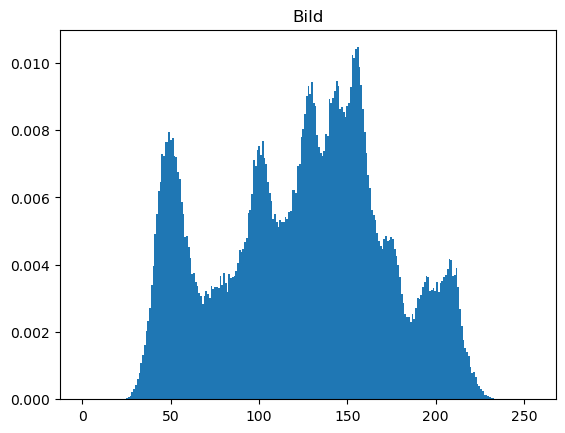

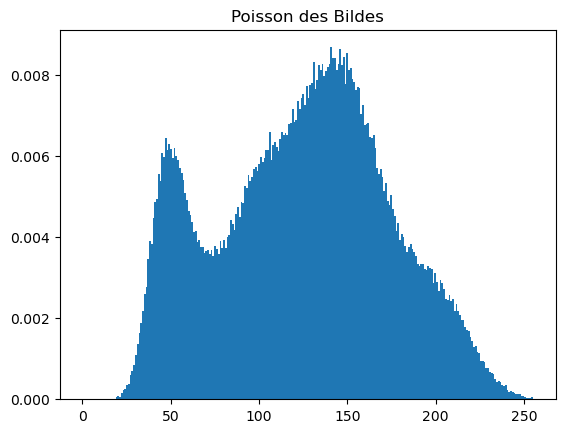

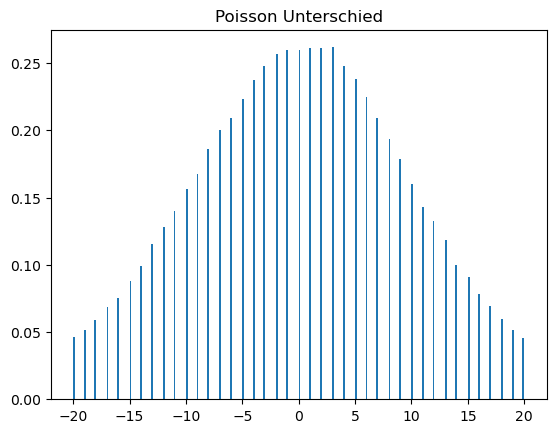

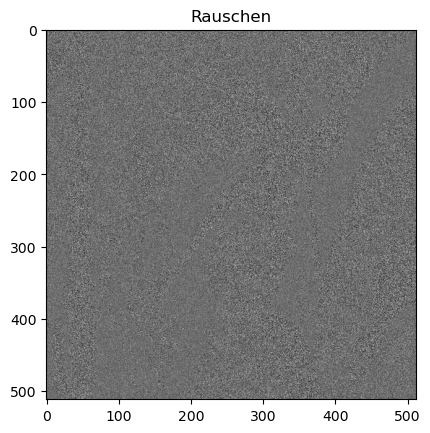

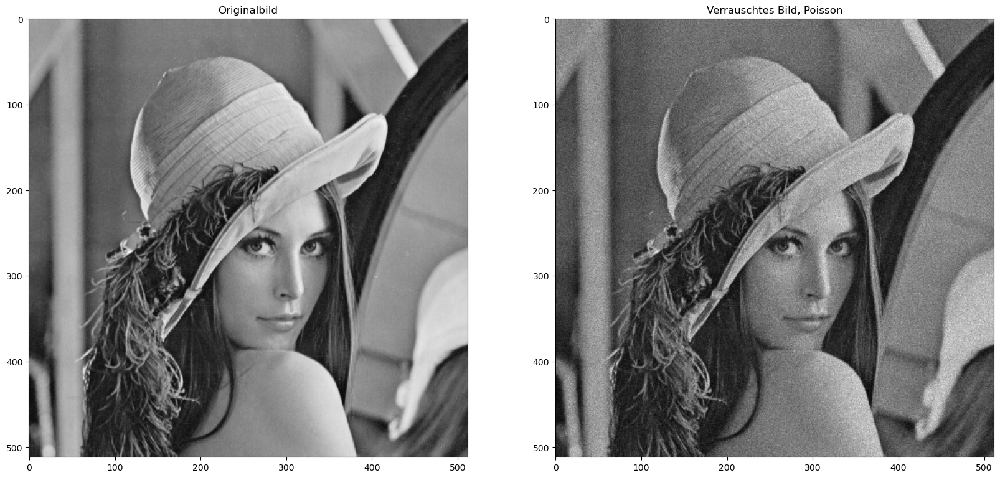

In [5]:
# Poisson-Rauschen
# img:    Bild
# debug:  falls True, so werden Rauschverteilung und Rauschbild ausgegeben
def add_poisson(img, debug=False):
    row, col = img.shape
    vals = len(np.unique(img))
    vals = 2 ** np.ceil(np.log2(vals))
    noisy = np.clip(np.random.poisson(img * vals) / float(vals), 0, 255)
    poisson = np.random.poisson(img, (row, col))

    if (debug):
        plt.figure()
        plt.hist(img.ravel(), 256, [0, 255], density=True)
        plt.title('Bild')
        plt.show()
        plt.figure()
        plt.hist(poisson.ravel(), 256, [0, 255], density=True)
        plt.title('Poisson des Bildes')
        plt.show()
        plt.figure()
        plt.hist(img.ravel() - poisson.ravel(), 256, [-20, 20], density=True)
        plt.title('Poisson Unterschied')
        plt.show()

    return poisson


debug = True
dst = add_poisson(img, debug)

if debug:
    diff = dst - img
    plt.imshow(diff, cmap='gray')
    plt.title('Rauschen')
    plt.show()

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 2, 2)
plt.imshow(dst, cmap='gray')
plt.title('Verrauschtes Bild, Poisson')
plt.show()

## Aufgabe: Rauschunterdrückung (Gauss)

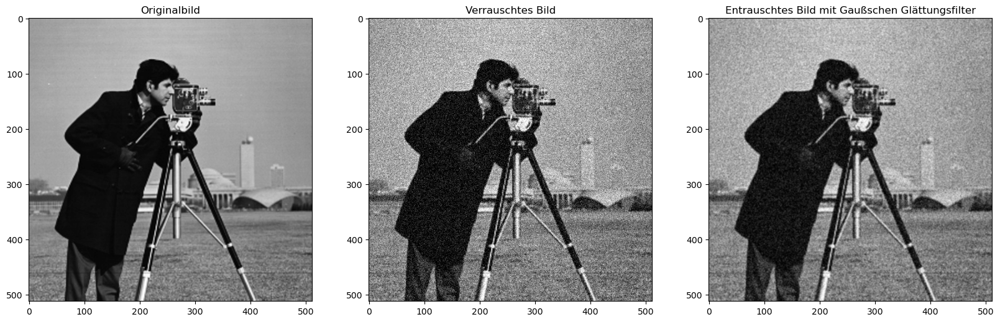

In [6]:
img = cv.imread('./img/cameraman.bmp', cv.IMREAD_GRAYSCALE)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')

# addiere Gaußsches Rauschen
img_noisy = add_gauss(img, 0, 1000)

plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')

# ToDo: Entfernen Sie das Gaußsche Rauschen (Experimentieren Sie mit den verschiedenen Faltungsfiltern)
# Implementation Gaußscher Glättungsfilter
kernel = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]], np.float32) / 16
img_gauss_glatt = cv.filter2D(img_noisy, -1, kernel)

plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Gaußschen Glättungsfilter')
plt.imshow(img_gauss_glatt, cmap='gray')
plt.show()

### Entrauschen mit Veränderten Gaußschen Glättungsfilter
Versuch, die Gaußsche Glättung zu verstärken.

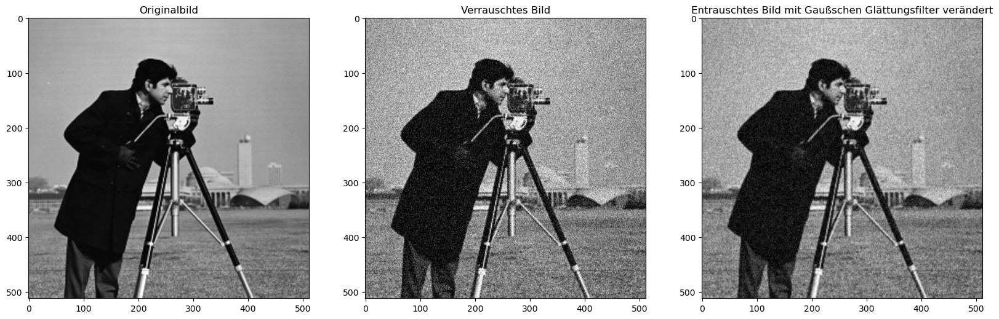

In [7]:
# Test: Veränderter Gaußscher Glättungsfilter
kernel = np.array([[1, 4, 1], [4, 8, 4], [1, 4, 1]], np.float32) / 28
img_gauss_test = cv.filter2D(img_noisy, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Gaußschen Glättungsfilter verändert')
plt.imshow(img_gauss_test, cmap='gray')
plt.show()

### Entrauschen mit Mittelwertfilter


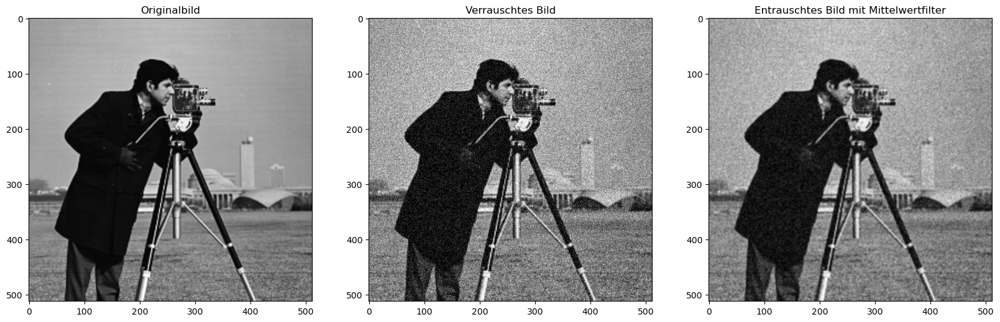

In [8]:
# Entrauschen mit Mittelwertfilter
kernel = np.ones((3, 3), np.float32) / 9
img_mittelwertfilter = cv.filter2D(img_noisy, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Mittelwertfilter')
plt.imshow(img_mittelwertfilter, cmap='gray')
plt.show()

### Entrauschen mit Manhattan-Nachbarschaft

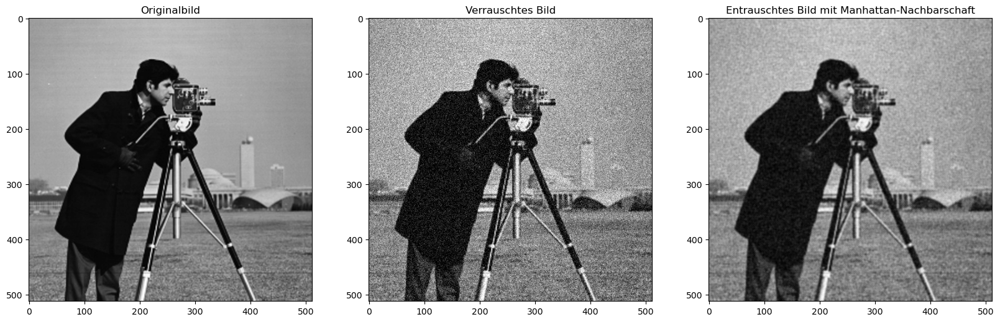

In [9]:
# Entrauschen mit Manhattan-Nachbarschaft
kernel = np.array([[0, 0, 1, 0, 0], [0, 1, 1, 1, 0], [1, 1, 1, 1, 1], [0, 1, 1, 1, 0], [0, 0, 1, 0, 0]],
                  np.float32) / 13
img_manhattan = cv.filter2D(img_noisy, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Manhattan-Nachbarschaft')
plt.imshow(img_manhattan, cmap='gray')
plt.show()

### Entrauschen mit Median-Filter von OpenCV
Median Filter von OpenCV kann auf Salt and Pepper Rauschen angewendet werden, aber nicht auf Gauss Rauschen.

Der Medianfilter ist eine Methode zur Rauschunterdrückung in Bildern, indem der Median der Pixelwerte in einem lokalen Bereich berechnet wird. Dies macht den Medianfilter effektiv bei der Entfernung von impulsartigem Rauschen, wie dem Salt-and-Pepper-Rauschen, da dieser Rauschtyp einzelne Pixel mit extremen Werten erzeugt, die sich deutlich von den benachbarten Pixeln unterscheiden.
In Bezug auf Gauss'sches Rauschen ist der Medianfilter weniger effektiv, da dieses Rauschen normalerweise eine glattere Verteilung von Pixelwerten erzeugt und keine diskreten Ausreißer. 

In [10]:
# Entrauschen mit Median-Filter von OpenCV
# img_median = cv.medianBlur(img_noisy, 3) # 3x3 Median-Filter   
# 
# plt.figure(figsize=(20,10))
# plt.subplot(1,3,1)
# plt.imshow(img, cmap='gray')
# plt.title('Originalbild')
# plt.subplot(1,3,2)
# plt.title('Verrauschtes Bild')
# plt.imshow(img_noisy, cmap='gray')
# plt.subplot(1,3,3)
# plt.title('Entrauschtes Bild mit Median-Filter von OpenCV')
# plt.imshow(img_median, cmap='gray')
# plt.show()

## Aufgabe: Rauschunterdrückung (Salt-and-Pepper)

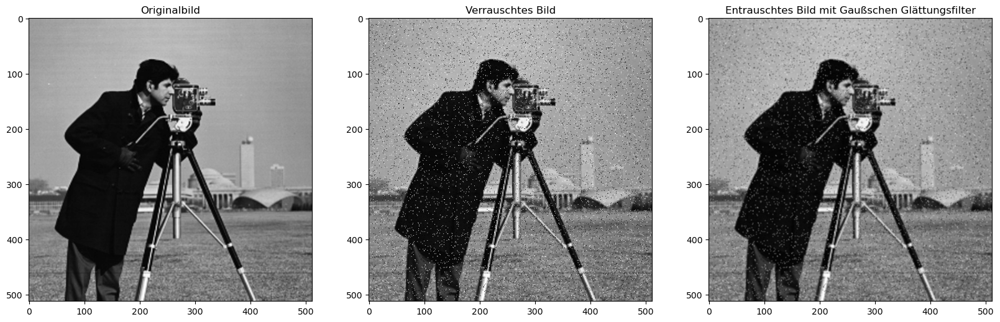

In [11]:
img = cv.imread('./img/cameraman.bmp', cv.IMREAD_GRAYSCALE)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')

# addiere Salt-and-Pepper-Rauschen
img_noisy = add_salt_pepper(img, amount=0.05)

plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')

# ToDo: Entfernen Sie das Salt-and-Pepper Rauschen (Experimentieren Sie mit den verschiedenen Faltungsfiltern)
# Implementation Gaußscher Glättungsfilter
kernel = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]], np.float32) / 16
img_gauss_glatt = cv.filter2D(img_noisy, -1, kernel)

plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Gaußschen Glättungsfilter')
plt.imshow(img_gauss_glatt, cmap='gray')
plt.show()

### Entrauschen mit veränderten Gaußschen Glättungsfilter
Versuch, die Gaußsche Glättung zu verstärken.

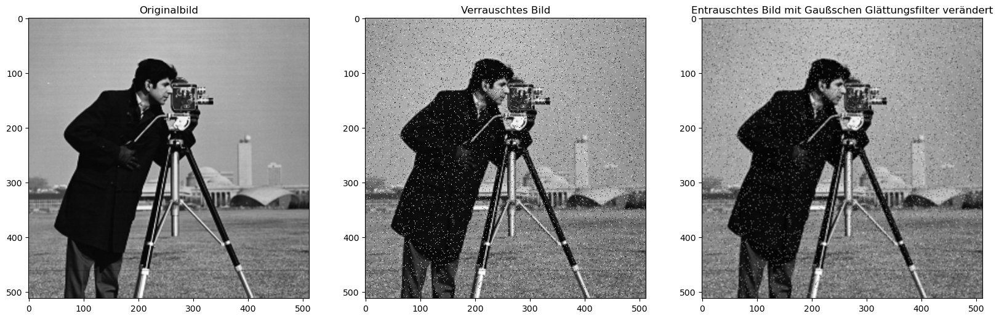

In [12]:
# Test: Veränderter Gaußscher Glättungsfilter
kernel = np.array([[1, 4, 1], [4, 8, 4], [1, 4, 1]], np.float32) / 28
img_gauss_test = cv.filter2D(img_noisy, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Gaußschen Glättungsfilter verändert')
plt.imshow(img_gauss_test, cmap='gray')
plt.show()

### Entrauschen mit Mittelwertfilter

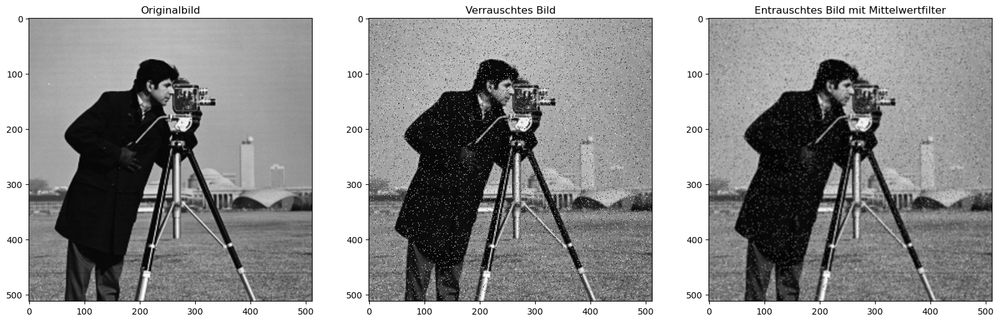

In [13]:
# Entrauschen mit Mittelwertfilter
kernel = np.ones((3, 3), np.float32) / 9
img_mittelwertfilter = cv.filter2D(img_noisy, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Mittelwertfilter')
plt.imshow(img_mittelwertfilter, cmap='gray')
plt.show()

### Entrauschen mit Manhattan-Nachbarschaft

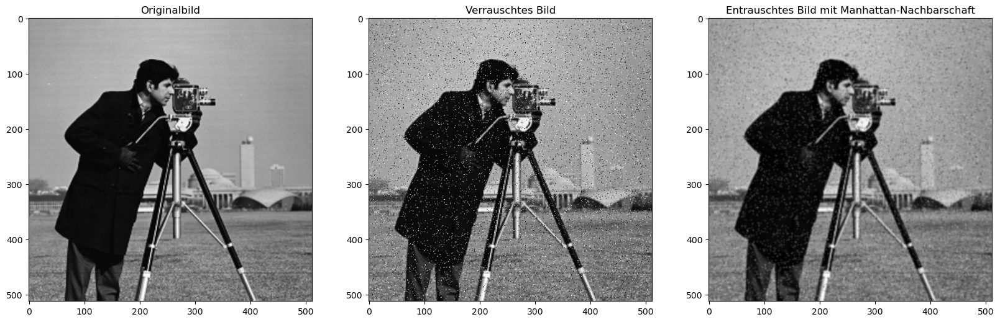

In [14]:
# Entrauschen mit Manhattan-Nachbarschaft
kernel = np.array([[0, 0, 1, 0, 0], [0, 1, 1, 1, 0], [1, 1, 1, 1, 1], [0, 1, 1, 1, 0], [0, 0, 1, 0, 0]],
                  np.float32) / 13
img_manhattan = cv.filter2D(img_noisy, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Manhattan-Nachbarschaft')
plt.imshow(img_manhattan, cmap='gray')
plt.show()

### Entrauschen mit Manhattan/Gauss-Nachbarschaft
Versuch, auf die Manhattan-Nachbarschaft eine Gaußsche Glättung anzuwenden.

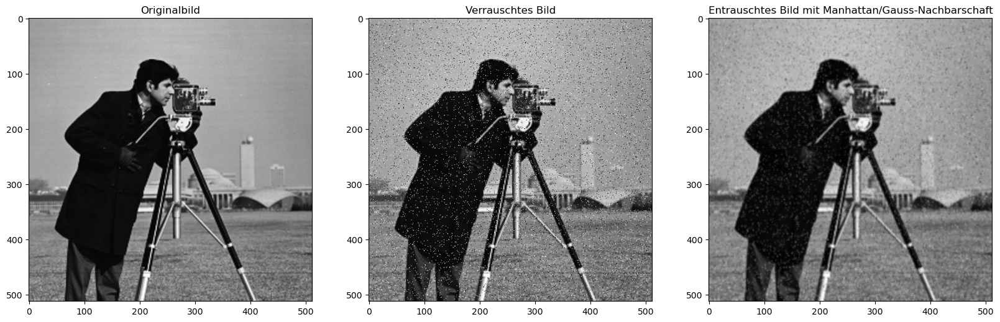

In [15]:
# Entrauschen mit Manhattan/Gauss-Nachbarschaft
kernel = np.array([[0, 1, 2, 1, 0], [1, 2, 4, 2, 1], [2, 4, 8, 4, 2], [0, 1, 2, 1, 0], [1, 2, 4, 2, 1]],
                  np.float32) / 48
img_manhattan_gauss = cv.filter2D(img_noisy, -1, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1, 3, 2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Entrauschtes Bild mit Manhattan/Gauss-Nachbarschaft')
plt.imshow(img_manhattan_gauss, cmap='gray')
plt.show()

### Entrauschen mit Median-Filter von OpenCV

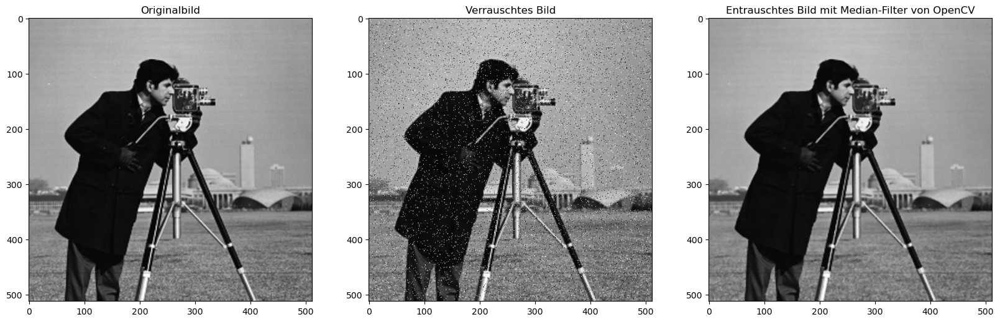

In [16]:
# Entrauschen mit Median-Filter von OpenCV
img_median = cv.medianBlur(img_noisy, 3) # 3x3 Median-Filter   

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(img, cmap='gray')
plt.title('Originalbild')
plt.subplot(1,3,2)
plt.title('Verrauschtes Bild')
plt.imshow(img_noisy, cmap='gray')
plt.subplot(1,3,3)
plt.title('Entrauschtes Bild mit Median-Filter von OpenCV')
plt.imshow(img_median, cmap='gray')
plt.show()

## Probability Distribution Functions

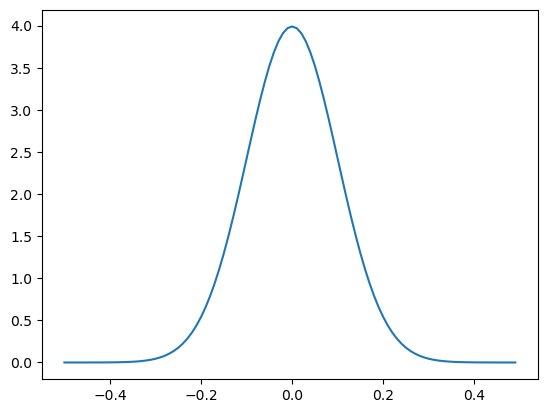

In [17]:
# Gauss
std_dev = 0.1
mean = 0
x = np.arange(-0.5, 0.5, 0.01)
p_gauss = 1 / (np.sqrt(2 * np.pi) * std_dev) * np.exp(-0.5 * ((x - mean) / std_dev) ** 2)
plt.plot(x, p_gauss)
plt.xlim = (-1, 1)

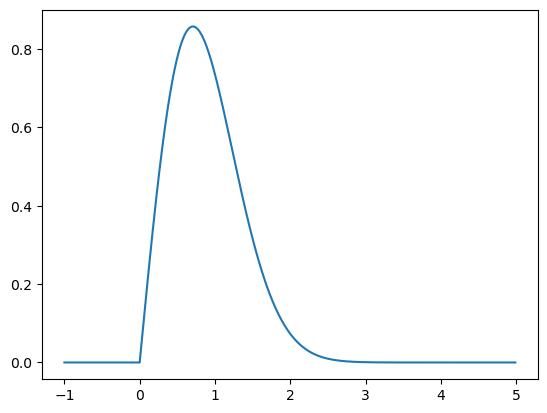

In [18]:
# Rayleigh
a = 0
b = 1
x = np.arange(-1, 5, 0.01)
p_rayleigh = 2 / b ** 2 * (x - a) * np.exp(-(x - a) ** 2 / b ** 2)
p_rayleigh[p_rayleigh < 0] = 0
plt.plot(x, p_rayleigh)
plt.xlim = (-1, 1)

C:\Users\Timo\AppData\Local\Temp\ipykernel_11444\1069687014.py:5: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  p_gamma = (a ** b * x ** (b - 1)) / (np.math.factorial(b - 1)) * np.exp(-a * x)


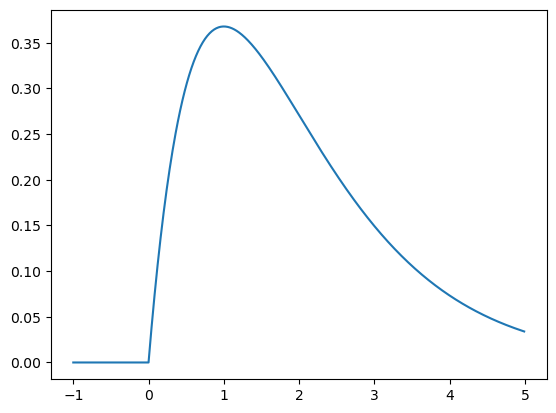

In [19]:
# Gamma
a = 1
b = 2
x = np.arange(-1, 5, 0.01)
p_gamma = (a ** b * x ** (b - 1)) / (np.math.factorial(b - 1)) * np.exp(-a * x)
2 / b ** 2 * (x - a) * np.exp(-(x - a) ** 2 / b ** 2)
p_gamma[p_gamma < 0] = 0
plt.plot(x, p_gamma)
plt.xlim = (-1, 1)

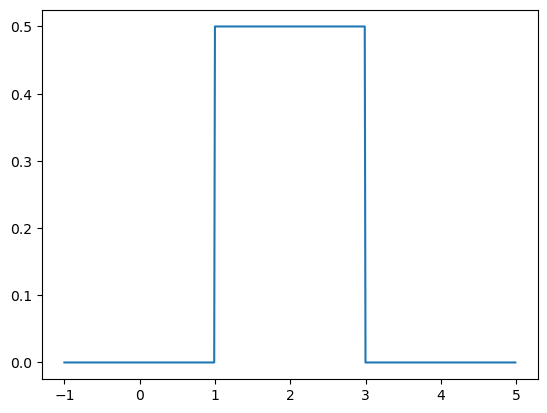

In [20]:
# Uniform
a = 1
b = 3
x = np.arange(-1, 5, 0.01)
p_uniform = np.full(x.shape, 1 / (b - a))
p_uniform[x < a] = 0
p_uniform[x > b] = 0
plt.plot(x, p_uniform)
plt.xlim = (-1, 1)

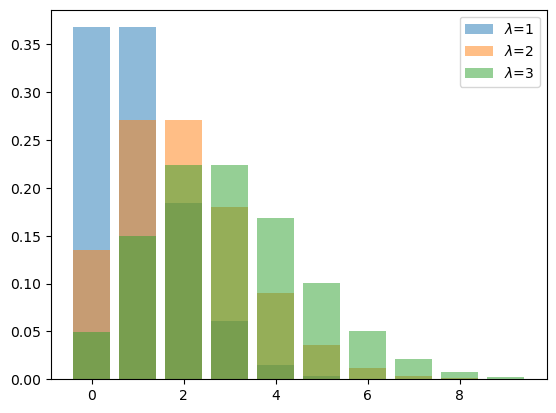

In [21]:
# Poisson
x = np.arange(0, 10, 1)
lam = 1
p_poisson_1 = lam ** x / factorial(x) * np.exp(-lam)
plt.bar(x, p_poisson_1, label='$\lambda$=1', alpha=0.5)
lam = 2
p_poisson_2 = lam ** x / factorial(x) * np.exp(-lam)
plt.bar(x, p_poisson_2, label='$\lambda$=2', alpha=0.5)
lam = 3
p_poisson_3 = lam ** x / factorial(x) * np.exp(-lam)
plt.bar(x, p_poisson_3, label='$\lambda$=3', alpha=0.5)
plt.legend()
plt.show()